In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Conv2D, MaxPooling2D, Flatten, TimeDistributed, Bidirectional, GRU
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import warnings
warnings.filterwarnings('ignore')

In [29]:
df = pd.read_csv("/kaggle/input/coca-cola-stock-data-over-100-years-of-trading/KO_1919-09-06_2025-04-06.csv")
df.head()

,date,open,high,low,close,adj_close,volume
0,1962-01-02 00:00:00-05:00,0.263021,0.270182,0.263021,0.263021,0.046041,806400
1,1962-01-03 00:00:00-05:00,0.259115,0.259115,0.253255,0.257161,0.045016,1574400
2,1962-01-04 00:00:00-05:00,0.257813,0.261068,0.257813,0.259115,0.045358,844800
3,1962-01-05 00:00:00-05:00,0.259115,0.262370,0.252604,0.253255,0.044332,1420800
4,1962-01-08 00:00:00-05:00,0.251302,0.251302,0.245768,0.250651,0.043876,2035200


In [30]:
df.isnull().sum()

date         0
open         0
high         0
low          0
close        0
adj_close    0
volume       0
dtype: int64

In [31]:
# Calculate the IQR for the specified columns
columns_to_check = ['open', 'high', 'low', 'close', 'adj_close', 'volume']
Q1 = df[columns_to_check].quantile(0.25)
Q3 = df[columns_to_check].quantile(0.75)
IQR = Q3 - Q1
# Remove rows where any of the columns have values outside of the IQR range
df_cleaned = df[~((df[columns_to_check] < (Q1 - 1.5 * IQR)) | (df[columns_to_check] > (Q3 + 1.5 * IQR))).any(axis=1)]
df_cleaned.shape, df.shape

((14293, 7), (15922, 7))

In [32]:
# Convert 'date' column to datetime and remove timezone if present
df_cleaned["date"] = pd.to_datetime(df_cleaned["date"], utc=True).dt.tz_convert(None)
df_cleaned.head()

,date,open,high,low,close,adj_close,volume
0,1962-01-02 05:00:00,0.263021,0.270182,0.263021,0.263021,0.046041,806400
1,1962-01-03 05:00:00,0.259115,0.259115,0.253255,0.257161,0.045016,1574400
2,1962-01-04 05:00:00,0.257813,0.261068,0.257813,0.259115,0.045358,844800
3,1962-01-05 05:00:00,0.259115,0.262370,0.252604,0.253255,0.044332,1420800
4,1962-01-08 05:00:00,0.251302,0.251302,0.245768,0.250651,0.043876,2035200


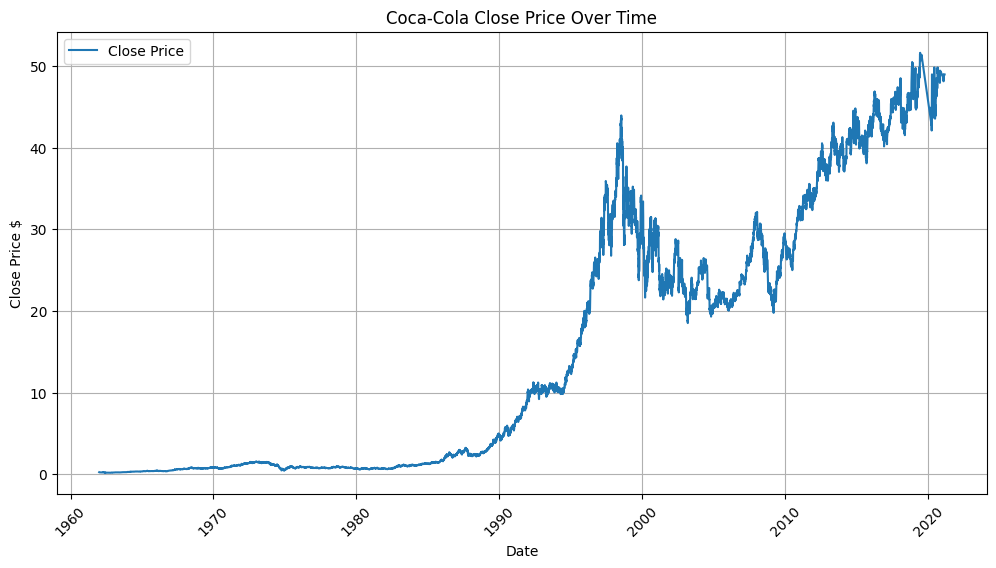

In [33]:
plt.figure(figsize=(12, 6))
plt.plot(df_cleaned["date"], df_cleaned["close"], label='Close Price')
plt.title('Coca-Cola Close Price Over Time')
plt.xlabel('Date')
plt.ylabel('Close Price $')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

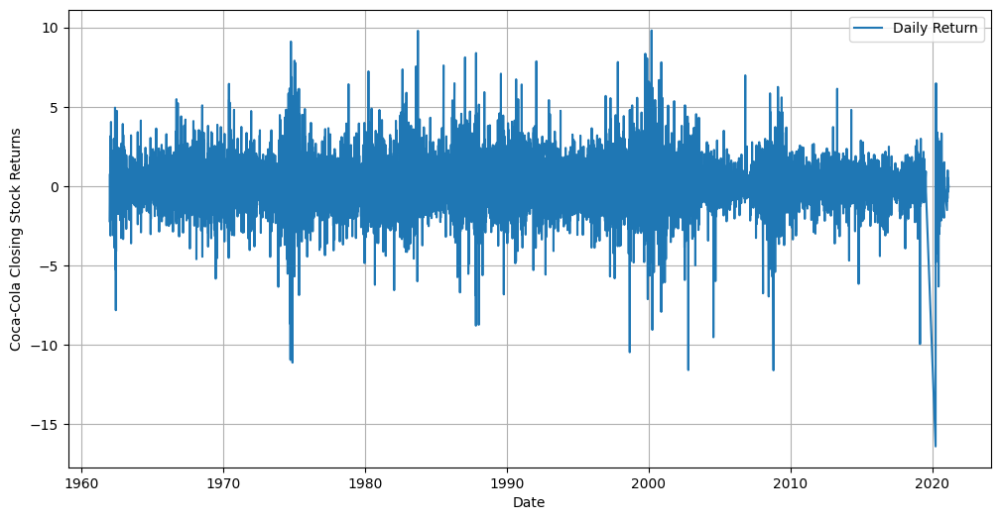

In [34]:
df_cleaned["Daily_Return"] = df_cleaned["close"].pct_change() * 100
plt.figure(figsize=(12, 6))
plt.plot(df_cleaned['date'], df_cleaned["Daily_Return"], label= "Daily Return")
plt.xlabel('Date')
plt.ylabel('Coca-Cola Closing Stock Returns')
plt.legend()
plt.grid(True)
plt.show()

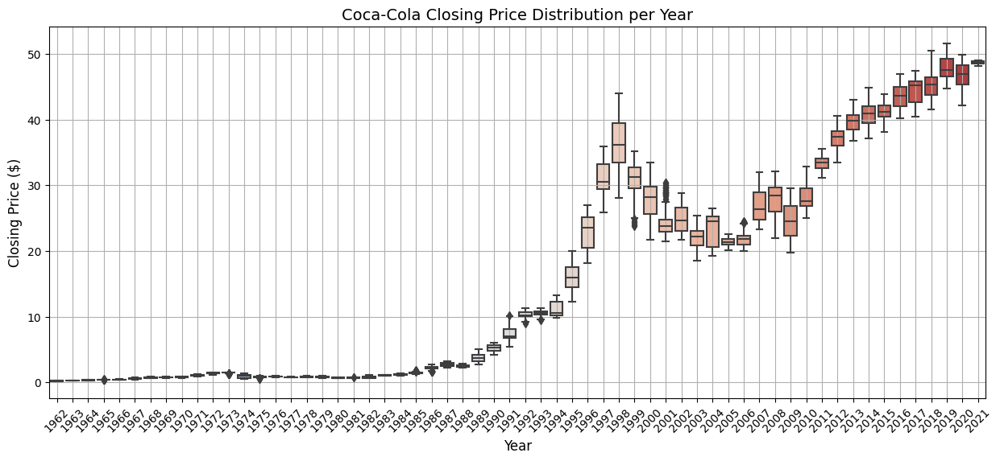

In [35]:
# Extract Year from Date
df_cleaned["Year"] = df_cleaned["date"].dt.year
# Plot Box Plot
plt.figure(figsize=(15, 6))
sns.boxplot(x=df_cleaned["Year"], y=df_cleaned["close"], palette="coolwarm")
# Labels & Formatting
plt.title("Coca-Cola Closing Price Distribution per Year", fontsize=14)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Closing Price ($)", fontsize=12)
plt.xticks(rotation=45)
plt.grid(True)

In [37]:
df_cleaned[['open', 'high', 'low', 'close', 'adj_close', 'volume']].describe()

,open,high,low,close,adj_close,volume
count,14293.000000,14293.000000,14293.000000,14293.000000,14293.000000,1.429300e+04
mean,14.651342,14.771191,14.531131,14.657149,8.978847,8.188302e+06
std,15.749396,15.866579,15.631836,15.753743,11.263132,6.374249e+06
min,0.192708,0.193359,0.182292,0.192057,0.034086,7.680000e+04
25%,0.837240,0.843750,0.830729,0.837240,0.213470,2.563200e+06
50%,5.578125,5.640625,5.500000,5.593750,2.439895,7.089600e+06
75%,27.062500,27.343750,26.825001,27.100000,14.576730,1.222340e+07
max,52.139999,52.189999,51.470001,51.639999,43.140293,2.857120e+07


Processing ticker: Coca-Cola Closing Price
Training with learning rate: 0.0001
Epoch 1/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - loss: 0.0601 - val_loss: 3.2876e-04
Epoch 2/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0035 - val_loss: 5.3189e-04
Epoch 3/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0031 - val_loss: 3.7602e-04
Epoch 4/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0034 - val_loss: 2.2110e-04
Epoch 5/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0028 - val_loss: 1.9405e-04
Epoch 6/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0028 - val_loss: 2.0337e-04
Epoch 7/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0026 - val_loss: 1.9583e-04
Epoch 8/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0028 - val_loss: 1.9278e-04
Epoch 9/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0024 - val_loss: 5.4537e-04
Epoch 10/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0025 - val_loss: 1.8900e-04
Epoch 11/5

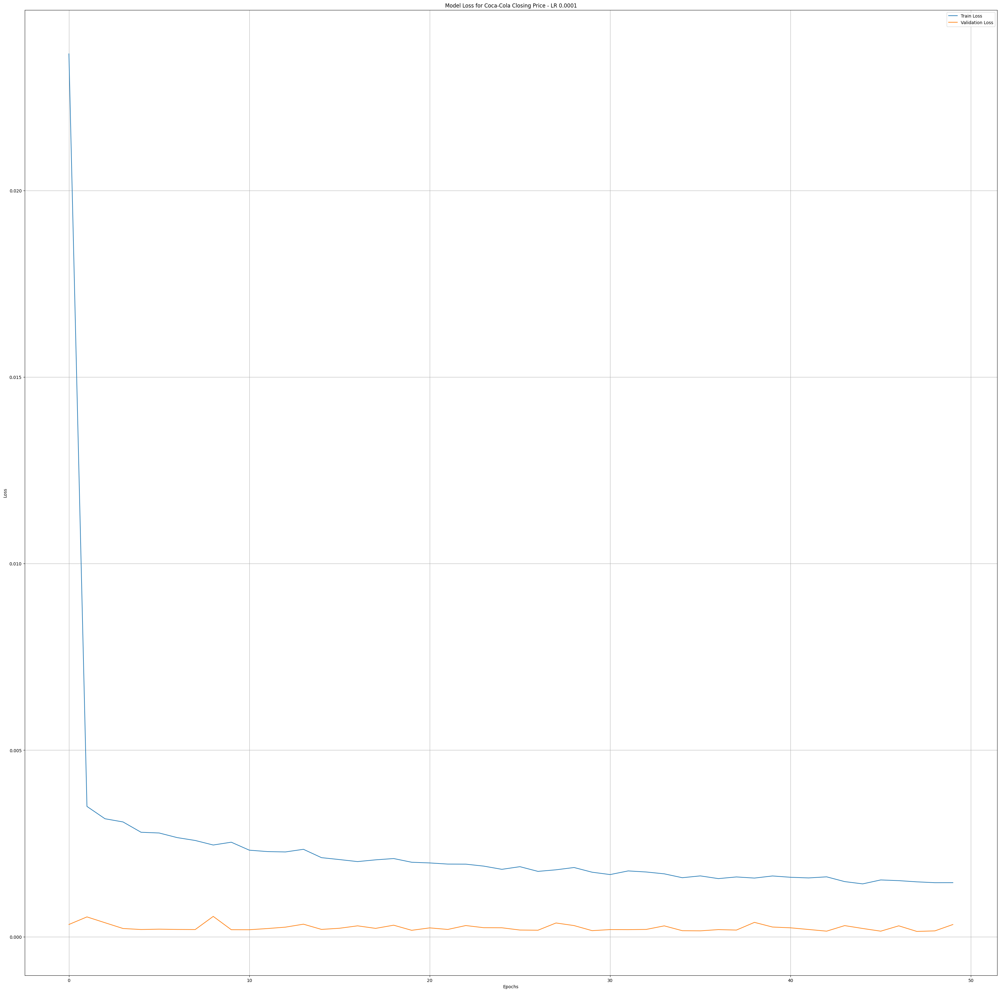

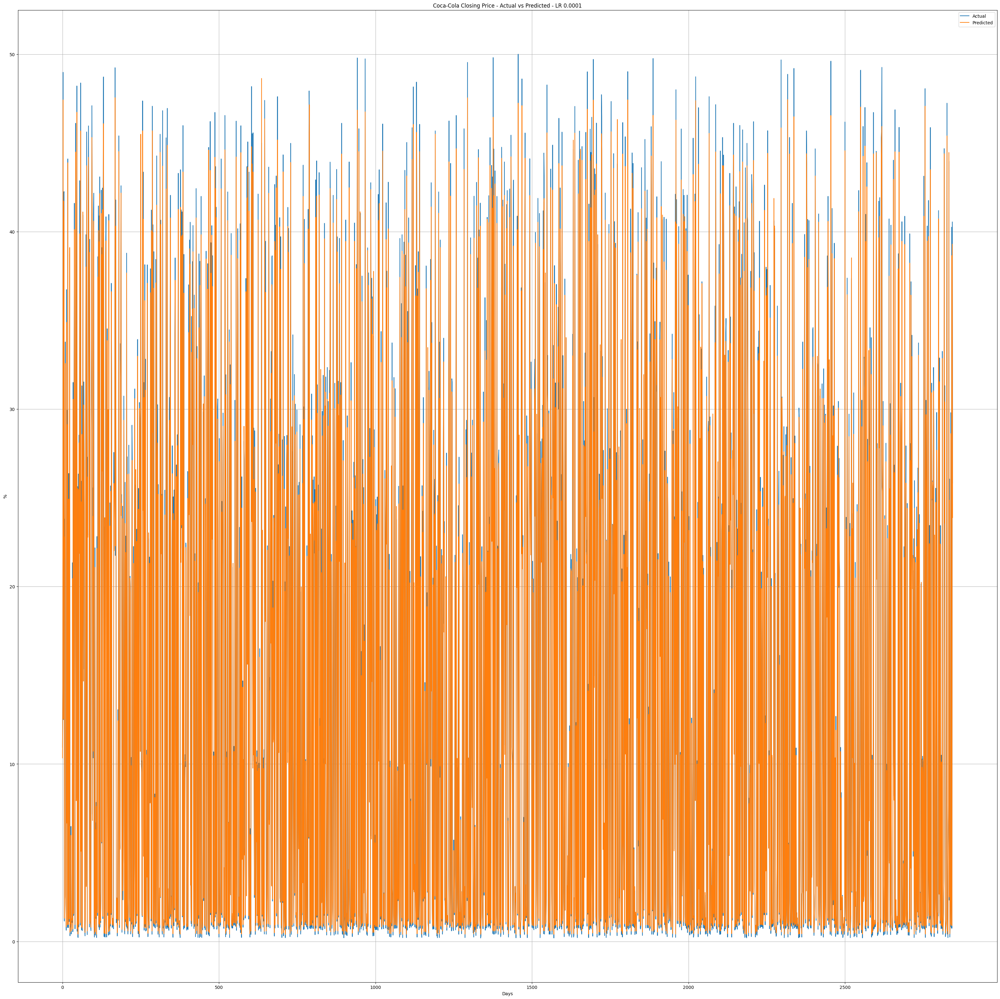

Training with learning rate: 0.001
Epoch 1/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - loss: 0.0221 - val_loss: 1.6737e-04
Epoch 2/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0026 - val_loss: 0.0013
Epoch 3/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0025 - val_loss: 1.8347e-04
Epoch 4/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0025 - val_loss: 5.6022e-04
Epoch 5/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0021 - val_loss: 5.1089e-04
Epoch 6/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0019 - val_loss: 2.3334e-04
Epoch 7/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0019 - val_loss: 1.1697e-04
Epoch 8/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0019 - val_loss: 1.5377e-04
Epoch 9/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0016 - val_loss: 1.2171e-04
Epoch 10/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0017 - val_loss: 1.9095e-04
Epoch 11/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - lo

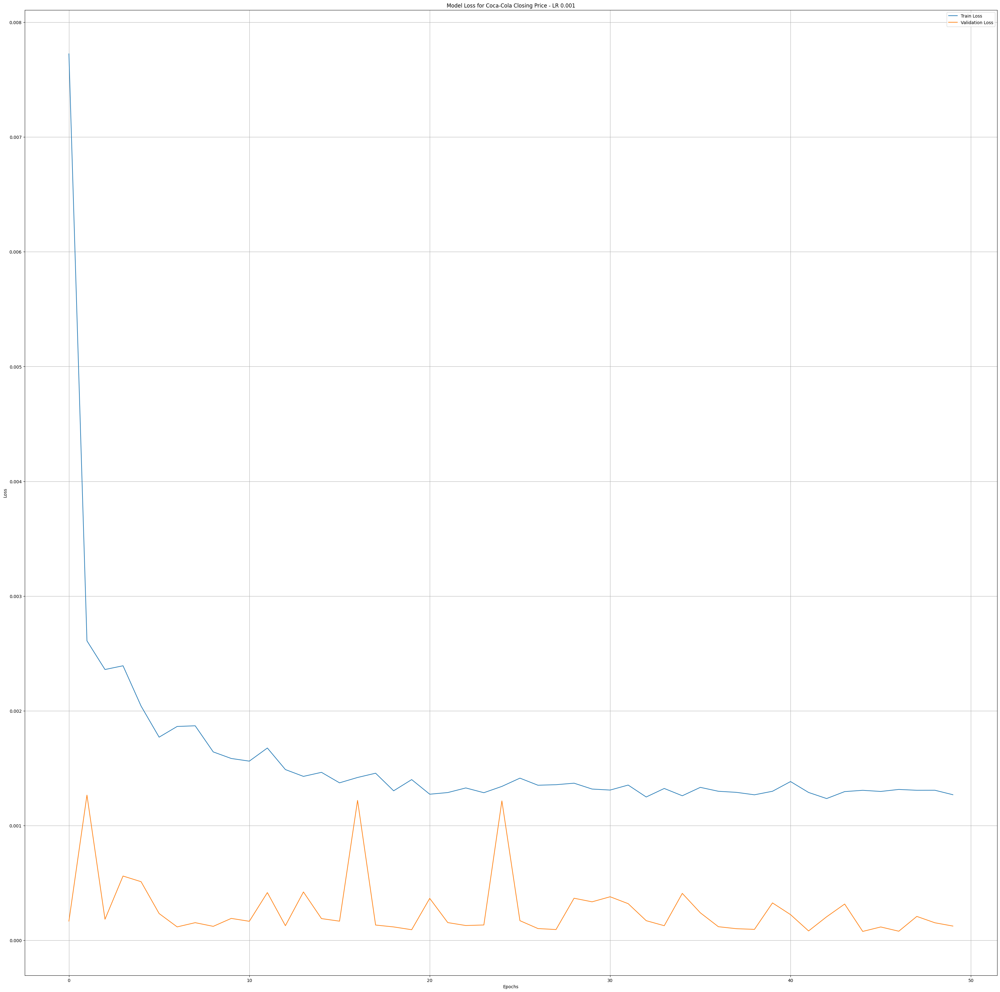

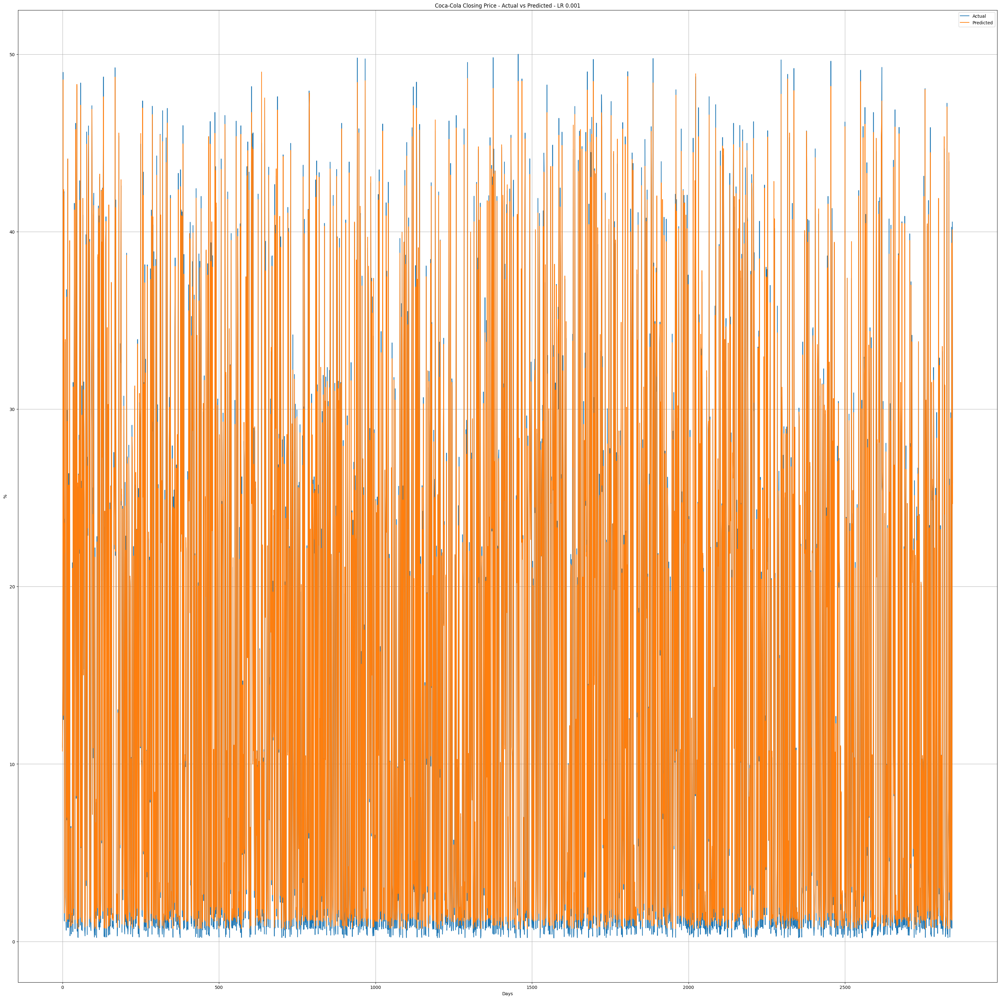

Training with learning rate: 0.01
Epoch 1/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - loss: 0.0353 - val_loss: 0.0012
Epoch 2/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0025 - val_loss: 5.2806e-04
Epoch 3/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0022 - val_loss: 6.5382e-04
Epoch 4/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0021 - val_loss: 1.7035e-04
Epoch 5/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0018 - val_loss: 6.2872e-04
Epoch 6/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0018 - val_loss: 2.9684e-04
Epoch 7/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0016 - val_loss: 2.3595e-04
Epoch 8/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0017 - val_loss: 2.5607e-04
Epoch 9/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0016 - val_loss: 2.1953e-04
Epoch 10/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0018 - val_loss: 6.7889e-04
Epoch 11/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - los

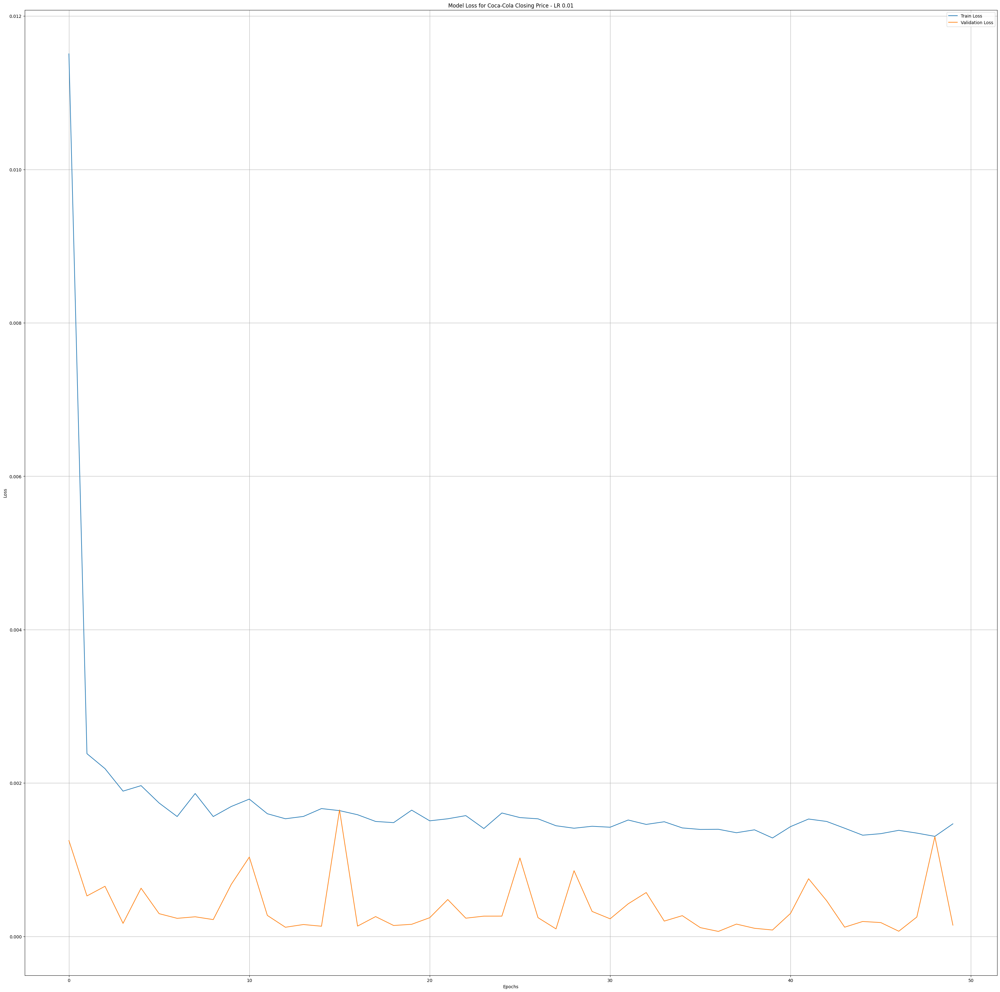

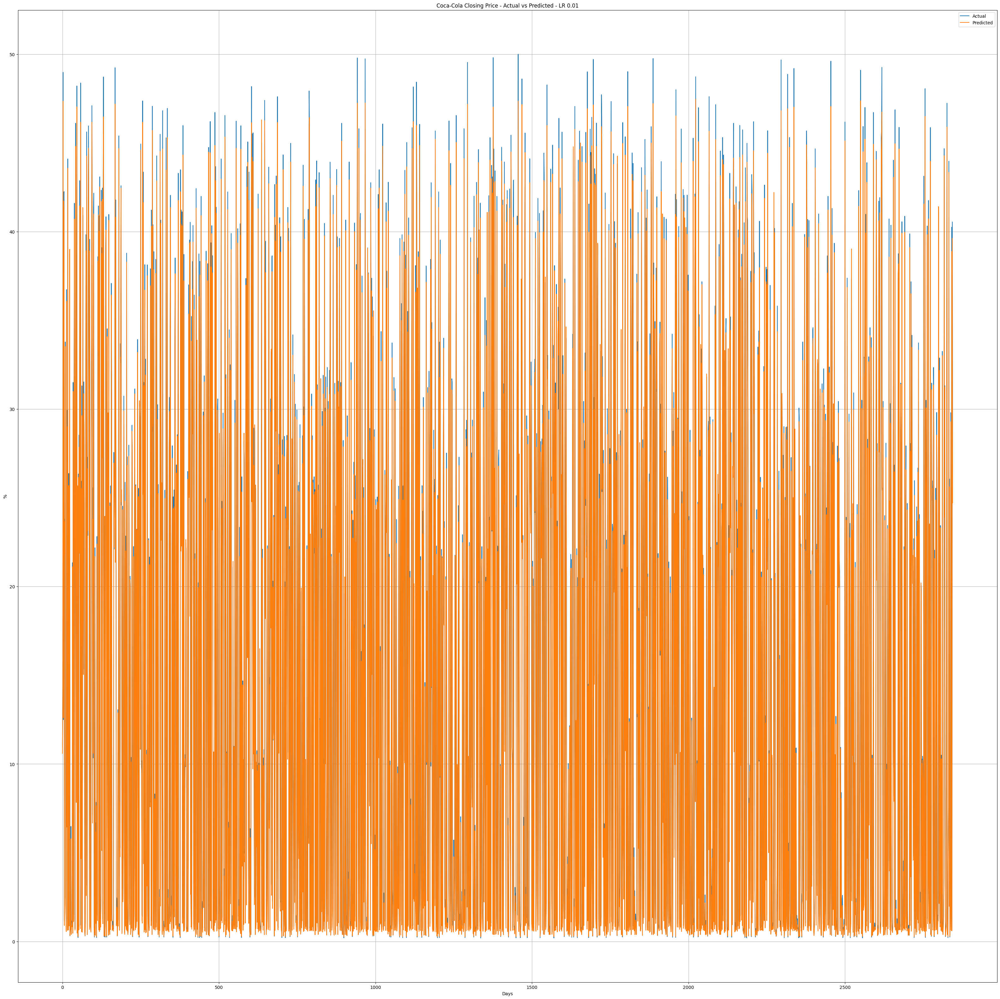

Training with learning rate: 0.1
Epoch 1/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - loss: 3.1386 - val_loss: 0.0609
Epoch 2/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0742 - val_loss: 0.0520
Epoch 3/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0720 - val_loss: 0.0496
Epoch 4/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0714 - val_loss: 0.0558
Epoch 5/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0732 - val_loss: 0.0535
Epoch 6/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0741 - val_loss: 0.0520
Epoch 7/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0720 - val_loss: 0.0567
Epoch 8/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0709 - val_loss: 0.0557
Epoch 9/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0791 - val_loss: 0.0550
Epoch 10/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0731 - val_loss: 0.0527
Epoch 11/50
143/143 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0723 - val_loss: 0.0553
Epoch 12

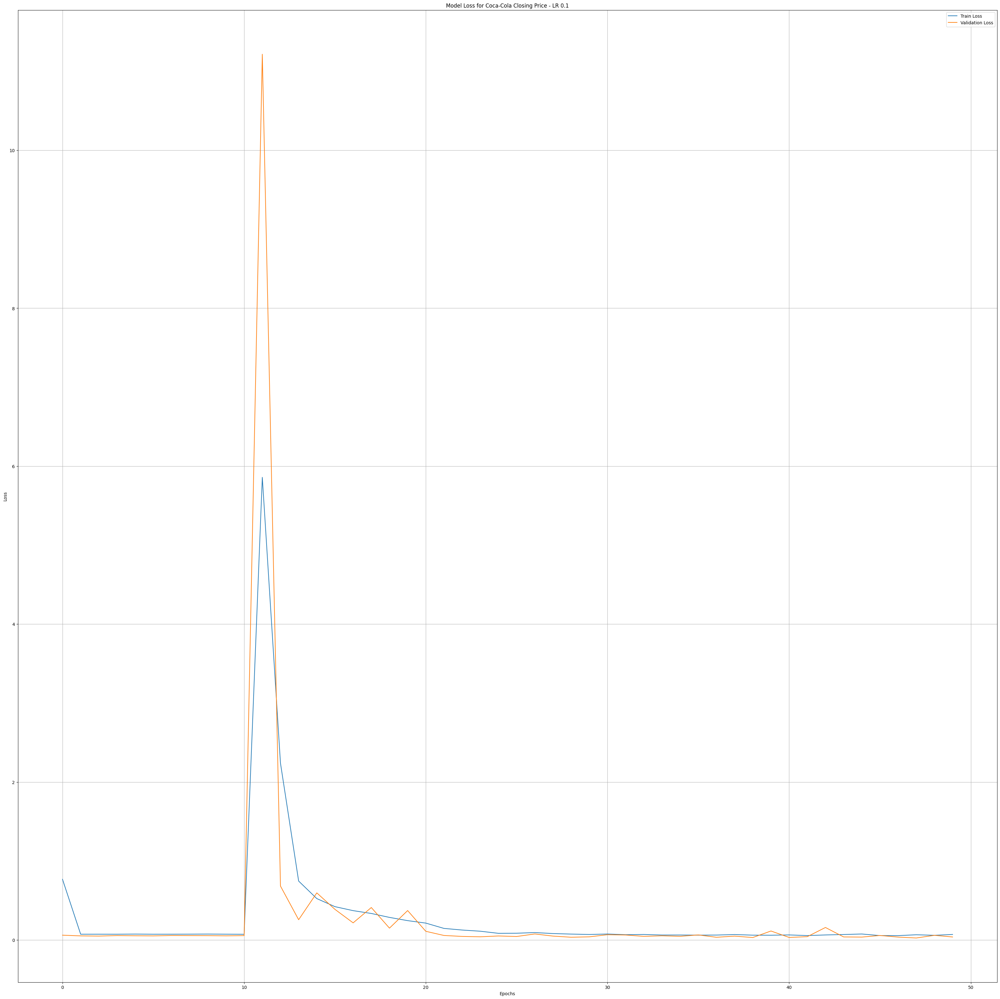

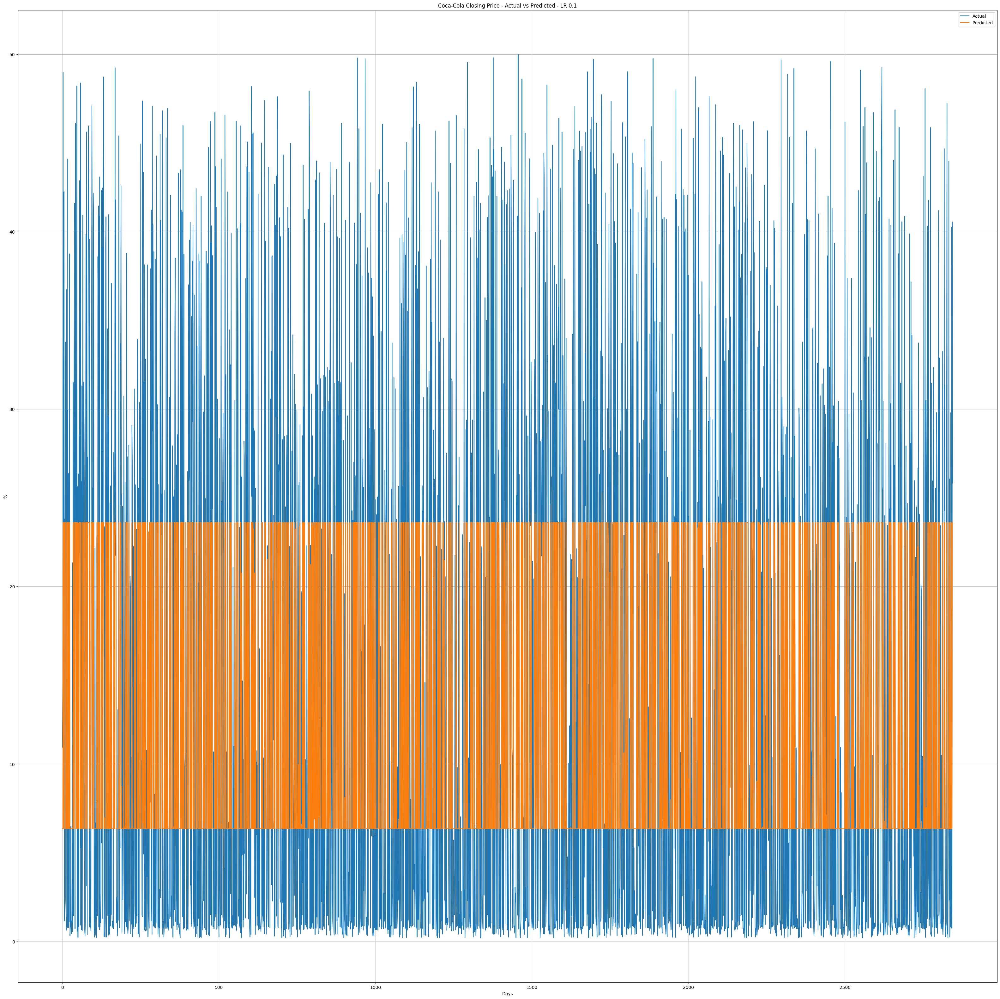

         0.0001     0.0010     0.0100     0.1000
0     10.340307  10.723517  10.598122   6.352969
1     13.972036  14.361711  14.345726   6.352970
2     47.425930  48.557911  47.347206  23.615538
3     12.525039  12.735185  12.604489   6.352969
4     41.724018  42.374504  41.726299  23.615538
...         ...        ...        ...        ...
2840   0.906896   1.214767   0.604362   6.352967
2841  38.648857  39.357037  38.878445  23.615538
2842   0.894703   1.191027   0.599100   6.352967
2843  39.294308  40.110363  39.624176  23.615538
2844  23.882004  24.667187  24.711830  23.606194

[2845 rows x 4 columns]


In [39]:
def fit_lstm_individual(df, look_back=70, epochs = 50, batch_size = 64, learning_rates=[0.0001, 0.001, 0.01, 0.1]):
    """
    Fits an LSTM model for Coca-Cola Closing Price using different learning rates.

    Parameters:
    - df: DataFrame containing adjusted close prices.
    - look_back: Number of past time steps to use as input features.
    - epochs: Number of epochs for training.
    - batch_size: Batch size for training.
    - learning_rates: List of learning rates to iterate over.
    Returns:
    - A dictionary with learning rates as keys and their trained models and predictions as values.
    - A DataFrame containing the predictions for Coca-Cola Closing Price.
    """
    results = {}
    predictions_dict = {}
    scaler = MinMaxScaler(feature_range=(0, 1))

    print("Processing ticker: Coca-Cola Closing Price")
    ticker_data = df_cleaned["close"].values.reshape(-1, 1)
    ticker_scaled = scaler.fit_transform(ticker_data)

    # Create dataset for time series modeling
    def create_dataset(data, look_back):
        X, Y = [], []
        for i in range(look_back, len(data)):
            X.append(data[i - look_back:i, 0])
            Y.append(data[i, 0])
        return np.array(X), np.array(Y)

    X, y = create_dataset(ticker_scaled, look_back)

    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Reshape input for LSTM
    X_train = X_train.reshape(X_train.shape[0], look_back, 1)
    X_test = X_test.reshape(X_test.shape[0], look_back, 1)
    for lr in learning_rates:
        print(f"Training with learning rate: {lr}")

        # LSTM model
        model = Sequential()
        model.add(LSTM(100, return_sequences=True, input_shape=(look_back, 1)))
        model.add(Dropout(0.5))
        model.add(LSTM(100, return_sequences=False))
        model.add(Dropout(0.5))
        model.add(Dense(1))
        # Compile the model
        optimizer = Adam(learning_rate=lr,clipnorm=1.0)
        model.compile(optimizer=optimizer, loss='mean_squared_error')
        # Train the model
        history = model.fit(
            X_train, y_train,
            epochs=epochs,
            batch_size=batch_size,
            validation_split=0.2,
            verbose=1
        )
        # Predictions
        y_pred = model.predict(X_test)
        y_pred_inv = scaler.inverse_transform(y_pred.reshape(-1, 1))
        y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

        # Save predictions
        predictions_dict[lr] = y_pred_inv.flatten()

        # Calculate metrics
        rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
        mae = mean_absolute_error(y_test_inv, y_pred_inv)
        r_squared = r2_score(y_test_inv, y_pred_inv)
        final_loss = history.history['loss'][-1]

        print(f"Coca-Cola Closing Price- Learning Rate: {lr} - RMSE: {rmse}, MAE: {mae}, R-squared: {r_squared}, Loss: {final_loss}")
        # Save results
        results[lr] = {
            'model': model,
            'predictions': y_pred_inv,
            'actuals': y_test_inv,
            'metrics': {
                'RMSE': rmse,
                'MAE': mae,
                'R-squared': r_squared,
                'Loss': final_loss
            },
            'history': history.history
        }

        # Plot training & validation loss
        plt.figure(figsize=(40, 40))
        plt.plot(history.history['loss'], label='Train Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model Loss for Coca-Cola Closing Price - LR {lr}')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Plot the results
        plt.figure(figsize=(40, 40))
        plt.plot(y_test_inv, label='Actual')
        plt.plot(y_pred_inv, label='Predicted')
        plt.title(f'Coca-Cola Closing Price - Actual vs Predicted - LR {lr}')
        plt.xlabel('Days')
        plt.ylabel('%')
        plt.legend()
        plt.grid(True)
        plt.show()

    # Convert predictions dictionary to DataFrame
    prediction = pd.DataFrame(predictions_dict)
    return results, prediction


results, prediction = fit_lstm_individual(df_cleaned)
print(prediction)

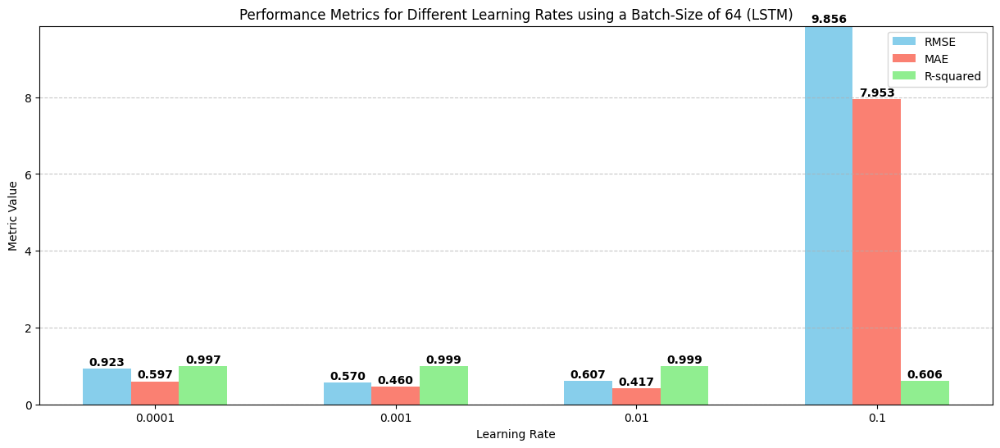

In [40]:
# Extract metrics from the results dictionary
learning_rates_list = list(results.keys())
rmses = [results[lr]['metrics']['RMSE'] for lr in learning_rates_list]
maes = [results[lr]['metrics']['MAE'] for lr in learning_rates_list]
r2s = [results[lr]['metrics']['R-squared'] for lr in learning_rates_list]

# Set width for grouped bars
bar_width = 0.2
x = np.arange(len(learning_rates_list))
plt.figure(figsize=(15, 6))
# Plot bars for RMSE, MAE, and R-squared
plt.bar(x - bar_width, rmses, width=bar_width, color='skyblue', label='RMSE')
plt.bar(x, maes, width=bar_width, color='salmon', label='MAE')
plt.bar(x + bar_width, r2s, width=bar_width, color='lightgreen', label='R-squared')
# Add labels
plt.xlabel('Learning Rate')
plt.ylabel('Metric Value')
plt.title('Performance Metrics for Different Learning Rates using a Batch-Size of 64 (LSTM)')
plt.xticks(x, learning_rates_list)  # Set x-axis labels to learning rates
plt.ylim(0, max(max(rmses), max(maes), 1.05))  # Adjust y-axis range
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels
def add_value_labels(ax, values, x_positions, offset):
    for i, val in enumerate(values):
        ax.text(x_positions[i], val + offset, f'{val:.3f}', ha='center', va='bottom', fontweight='bold')
ax = plt.gca()
add_value_labels(ax, rmses, x - bar_width, 0.02)
add_value_labels(ax, maes, x, 0.02)
add_value_labels(ax, r2s, x + bar_width, 0.02)
plt.show()

Processing ticker: Coca-Cola Closing Price
Training with learning rate: 1e-05
Epoch 1/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 52s 108ms/step - loss: 0.1142 - val_loss: 0.0374
Epoch 2/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0258 - val_loss: 0.0051
Epoch 3/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0057 - val_loss: 0.0011
Epoch 4/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0028 - val_loss: 4.2020e-04
Epoch 5/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0023 - val_loss: 3.7599e-04
Epoch 6/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0023 - val_loss: 3.6040e-04
Epoch 7/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0020 - val_loss: 3.5814e-04
Epoch 8/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.0020 - val_loss: 3.5772e-04
Epoch 9/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0019 - val_loss: 4.0014e-04
Epoch 10/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0018 - val_loss: 3.3152e-04
Epoch 11/50


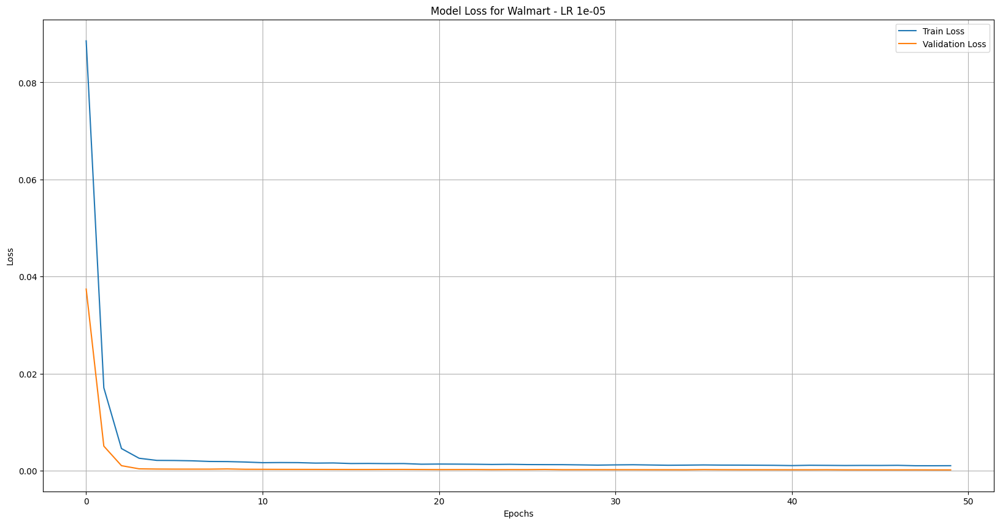

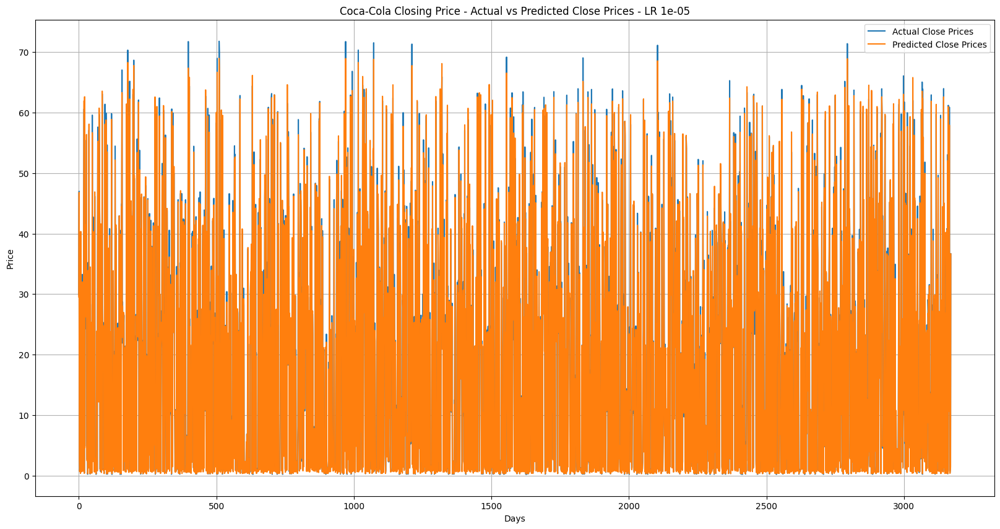

Training with learning rate: 0.0001
Epoch 1/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 52s 110ms/step - loss: 0.0389 - val_loss: 3.5984e-04
Epoch 2/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0018 - val_loss: 2.8234e-04
Epoch 3/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.0016 - val_loss: 2.6106e-04
Epoch 4/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.0013 - val_loss: 2.2899e-04
Epoch 5/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0013 - val_loss: 4.6965e-04
Epoch 6/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.0012 - val_loss: 2.2063e-04
Epoch 7/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0011 - val_loss: 2.0989e-04
Epoch 8/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0011 - val_loss: 2.0886e-04
Epoch 9/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0011 - val_loss: 2.7504e-04
Epoch 10/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.0011 - val_loss: 2.7204e-04
Epoch 11/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 1

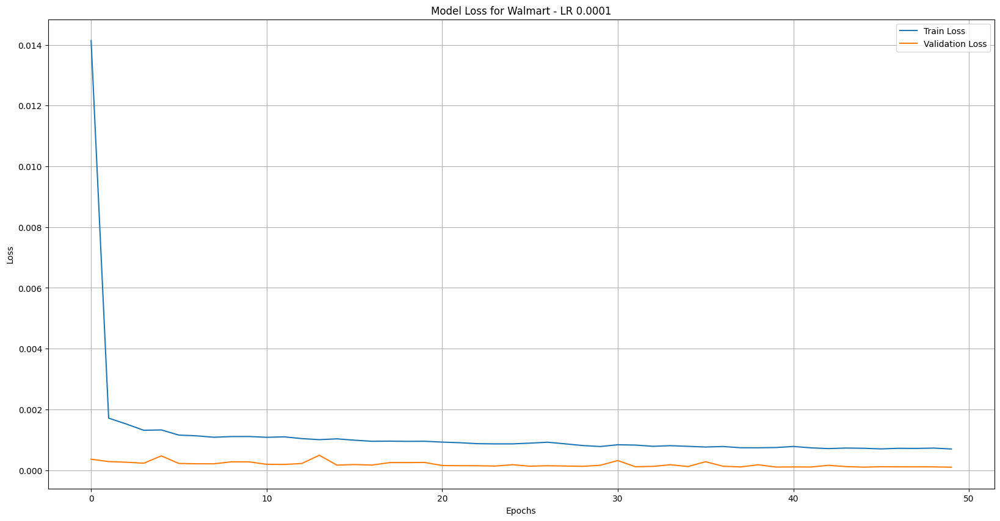

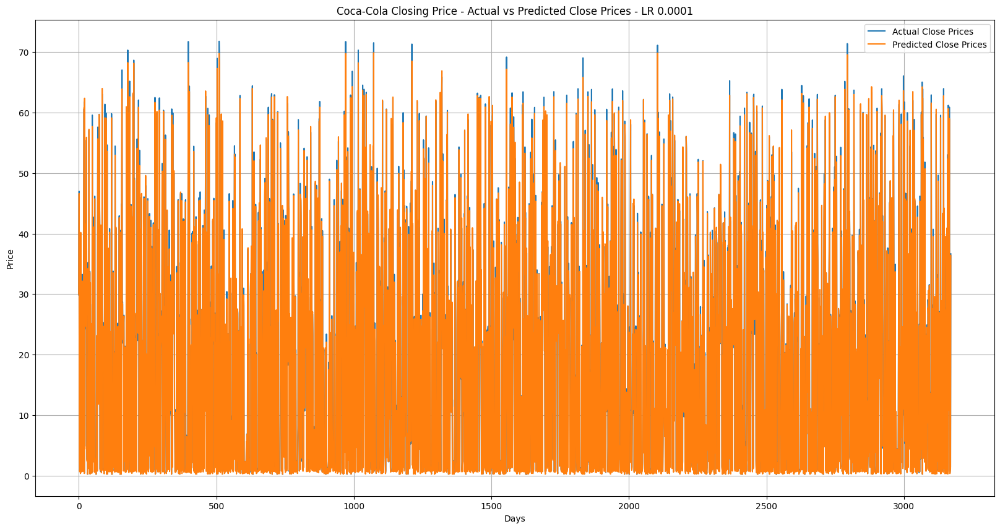

Training with learning rate: 0.001
Epoch 1/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - loss: 0.0130 - val_loss: 5.9258e-04
Epoch 2/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0016 - val_loss: 0.0012
Epoch 3/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0015 - val_loss: 2.1730e-04
Epoch 4/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.0012 - val_loss: 3.3143e-04
Epoch 5/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0011 - val_loss: 5.2077e-04
Epoch 6/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.0010 - val_loss: 1.5411e-04
Epoch 7/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 9.7421e-04 - val_loss: 1.4548e-04
Epoch 8/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 8.9316e-04 - val_loss: 2.3866e-04
Epoch 9/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 8.8541e-04 - val_loss: 2.0951e-04
Epoch 10/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 8.7742e-04 - val_loss: 1.7197e-04
Epoch 11/50
159/159 ━━━━━━━━━━━

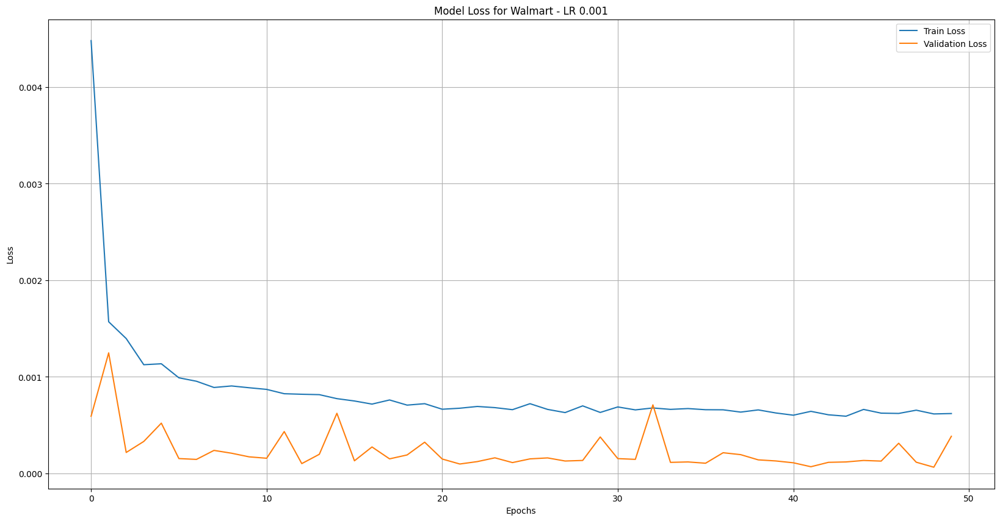

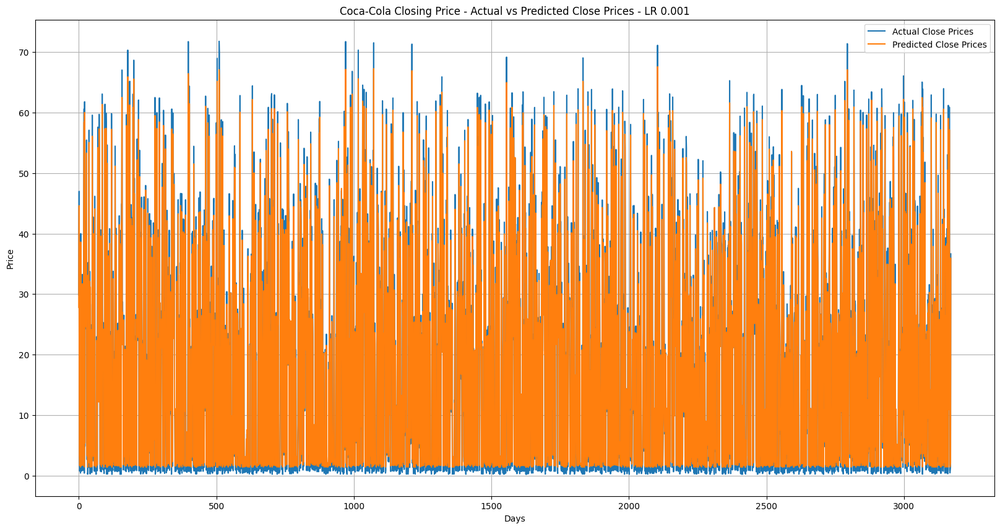

Training with learning rate: 0.01
Epoch 1/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.0827 - val_loss: 7.8239e-04
Epoch 2/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0018 - val_loss: 1.8916e-04
Epoch 3/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0013 - val_loss: 2.6412e-04
Epoch 4/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0011 - val_loss: 6.9834e-04
Epoch 5/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0010 - val_loss: 8.4692e-04
Epoch 6/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0011 - val_loss: 6.2109e-04
Epoch 7/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 9.9300e-04 - val_loss: 5.5741e-04
Epoch 8/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 9.4097e-04 - val_loss: 1.0602e-04
Epoch 9/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 8.8792e-04 - val_loss: 2.0450e-04
Epoch 10/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 8.3626e-04 - val_loss: 9.7460e-04
Epoch 11/50
159/159 ━━━━━━━━

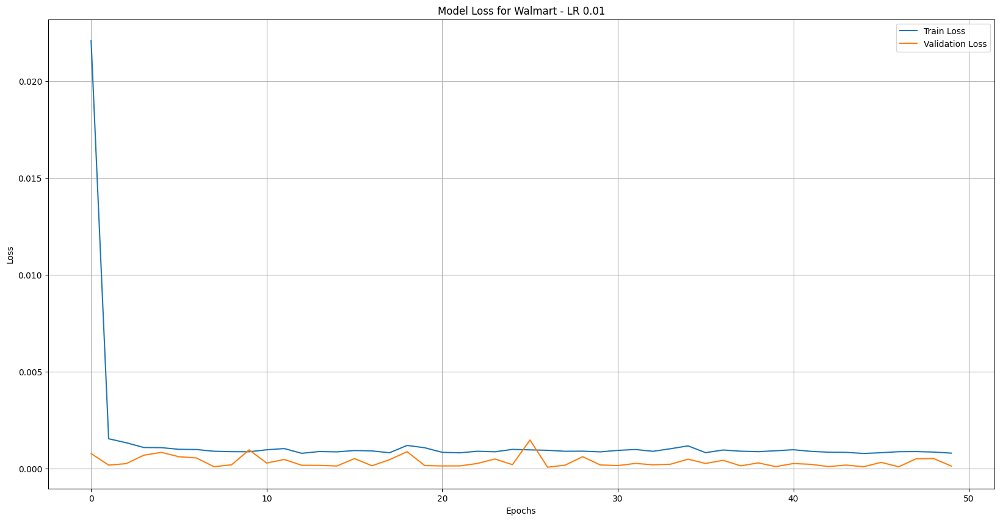

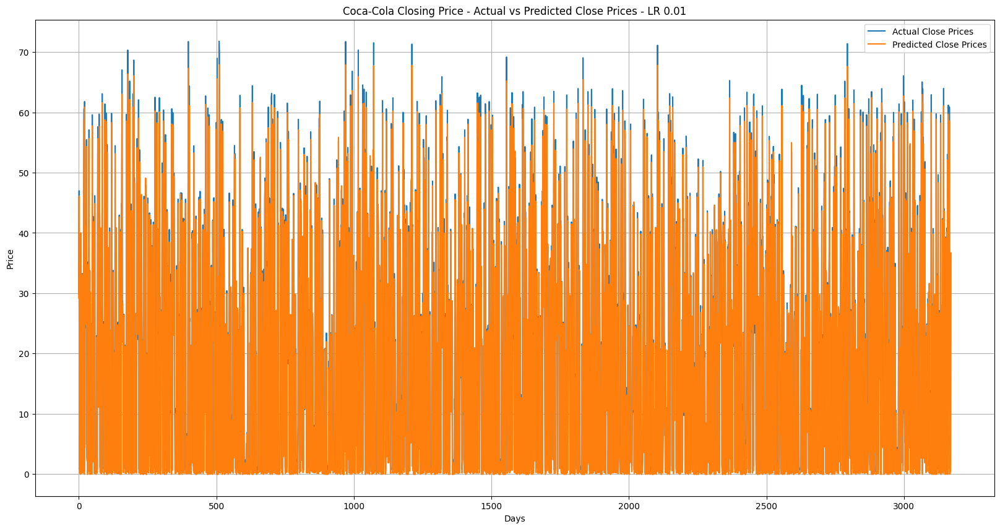

Training with learning rate: 0.1
Epoch 1/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 5.4678 - val_loss: 0.2450
Epoch 2/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1524 - val_loss: 0.2296
Epoch 3/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1977 - val_loss: 0.5216
Epoch 4/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2110 - val_loss: 0.0694
Epoch 5/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2697 - val_loss: 0.2945
Epoch 6/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1764 - val_loss: 0.0740
Epoch 7/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2166 - val_loss: 0.1260
Epoch 8/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2278 - val_loss: 0.1187
Epoch 9/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2657 - val_loss: 0.0694
Epoch 10/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2275 - val_loss: 0.0893
Epoch 11/50
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2366 - val_loss: 0.0

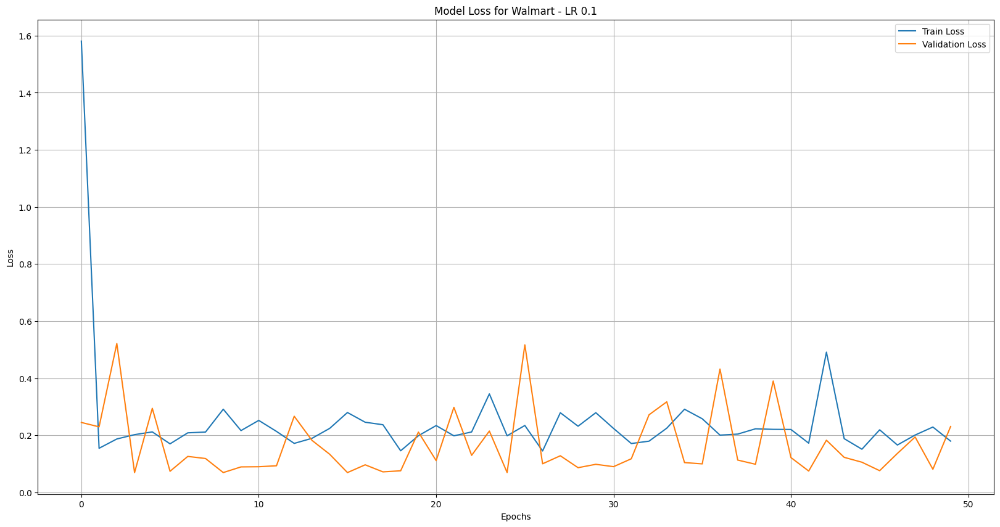

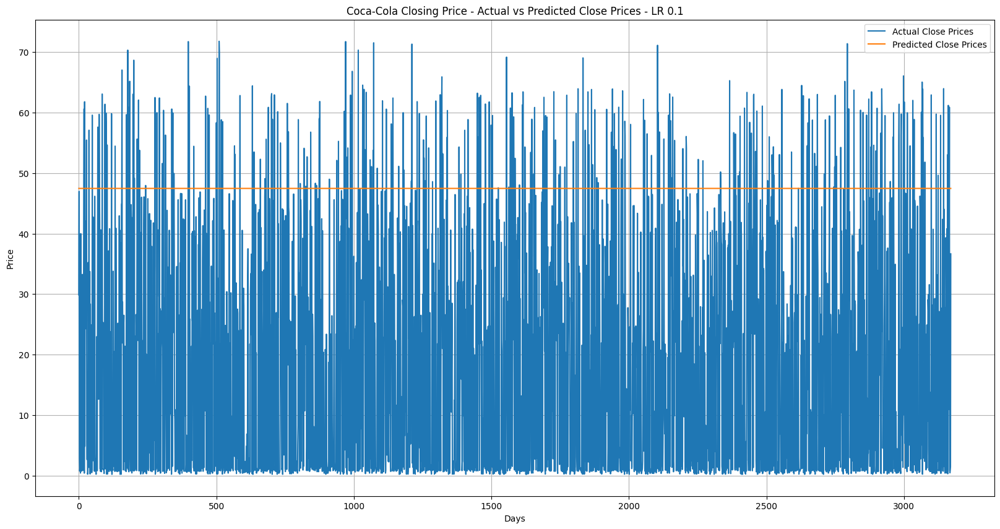

,0.00001,0.00010,0.00100,0.01000,0.10000
0,29.524332,30.003178,27.804125,29.165840,47.473827
1,46.804401,46.625561,44.608776,46.097702,47.473827
2,2.611138,2.491119,3.413235,2.429318,47.473827
3,0.666815,0.635466,1.665143,0.134932,47.473827
4,1.246431,1.142225,2.112903,0.506305,47.473827


In [42]:
def fit_cnn_gru_lstm_individual(df, look_back=70, epochs=50, batch_size=64, learning_rates=[0.00001, 0.0001, 0.001, 0.01, 0.1]):
    """
    Fits an CNN+GRU-LSTM model of Coca-Cola Closing Price using different learning rates.

    Parameters:
    - df: DataFrame containing adjusted close prices.
    - look_back: Number of past time steps to use as input features.
    - epochs: Number of epochs for training.
    - batch_size: Batch size for training.
    - learning_rates: List of learning rates to iterate over.

    Returns:
    - A dictionary with learning rates as keys and their trained models and predictions as values.
    - A DataFrame containing the predictions for Coca-Cola Closing Price.
    """
    results = {}
    predictions_dict = {}
    scaler = MinMaxScaler(feature_range=(0, 1))

    print("Processing ticker: Coca-Cola Closing Price")
    ticker_data = df["close"].values.reshape(-1, 1)
    ticker_scaled = scaler.fit_transform(ticker_data)

    # Create dataset for time series modeling
    def create_dataset(data, look_back):
        X, Y = [], []
        for i in range(look_back, len(data)):
            X.append(data[i - look_back:i, 0])
            Y.append(data[i, 0])
        return np.array(X), np.array(Y)

    X, y = create_dataset(ticker_scaled, look_back)

    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Reshape input for CNN-LSTM
    X_train = X_train.reshape(X_train.shape[0], look_back, 1, 1, 1)
    X_test = X_test.reshape(X_test.shape[0], look_back, 1, 1, 1)

    for lr in learning_rates:
        print(f"Training with learning rate: {lr}")

        # CNN+GRU-LSTM model
        gl = Sequential()
        gl.add(TimeDistributed(Conv2D(filters=64, kernel_size=(1, 1), activation='relu'),
                               input_shape=(look_back, 1, 1, 1)))
        gl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        gl.add(TimeDistributed(Conv2D(filters=128, kernel_size=(1, 1), activation='relu')))
        gl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        gl.add(TimeDistributed(Conv2D(filters=64, kernel_size=(1, 1), activation='relu')))
        gl.add(TimeDistributed(MaxPooling2D(pool_size=(1, 1))))
        gl.add(TimeDistributed(Flatten()))
        gl.add(Bidirectional(GRU(100, return_sequences=True)))
        gl.add(Dropout(0.5))
        gl.add(Bidirectional(LSTM(100, return_sequences=False)))
        gl.add(Dropout(0.5))
        gl.add(Dense(1))

        # Compile the model
        optimizer = Adam(learning_rate=lr)
        gl.compile(optimizer=optimizer, loss='mean_squared_error')

        # Train the model
        history = gl.fit(
            X_train, y_train,
            epochs=epochs,
            batch_size=batch_size,
            validation_split=0.2,
            verbose=1
        )

        # Predictions
        y_pred = gl.predict(X_test)
        y_pred_inv = scaler.inverse_transform(y_pred.reshape(-1, 1))
        y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

        # Save predictions
        predictions_dict[lr] = y_pred_inv.flatten()

        # Calculate metrics
        rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
        mae = mean_absolute_error(y_test_inv, y_pred_inv)
        r_squared = r2_score(y_test_inv, y_pred_inv)
        final_loss = history.history['loss'][-1]

        print(f"Coca-Cola Closing Price - Learning Rate: {lr} - RMSE: {rmse}, MAE: {mae}, R-squared: {r_squared}, Loss: {final_loss}")

        # Save results
        results[lr] = {
            'model': gl,
            'predictions': y_pred_inv,
            'actuals': y_test_inv,
            'metrics': {
                'RMSE': rmse,
                'MAE': mae,
                'R-squared': r_squared,
                'Loss': final_loss
            },
            'history': history.history
        }

        # Plot training & validation loss
        plt.figure(figsize=(20, 10))
        plt.plot(history.history['loss'], label='Train Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model Loss for Walmart - LR {lr}')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Plot the results
        plt.figure(figsize=(20, 10))
        plt.plot(y_test_inv, label='Actual Close Prices')
        plt.plot(y_pred_inv, label='Predicted Close Prices')
        plt.title(f'Coca-Cola Closing Price - Actual vs Predicted Close Prices - LR {lr}')
        plt.xlabel('Days')
        plt.ylabel('Price')
        plt.legend()
        plt.grid(True)
        plt.show()

    # Convert predictions dictionary to DataFrame
    prediction = pd.DataFrame(predictions_dict)
    return results, prediction


results, prediction = fit_cnn_gru_lstm_individual(df)
prediction.head()

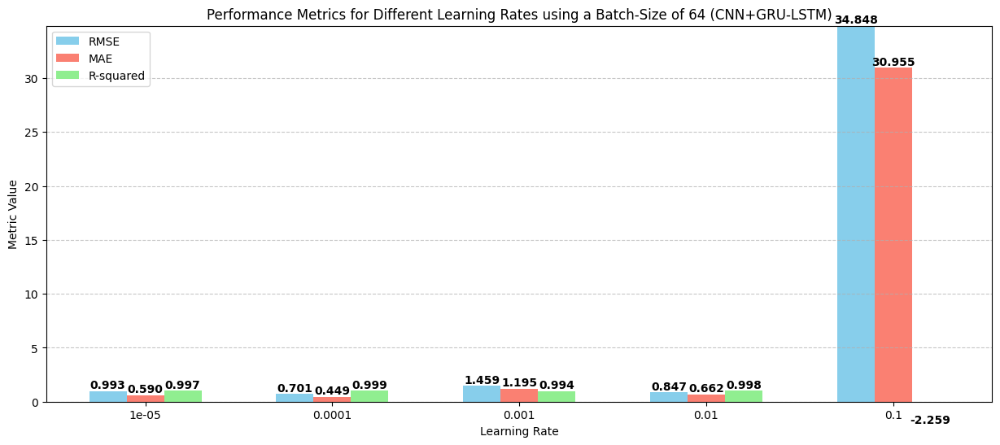

In [43]:
# Extract metrics from the results dictionary
learning_rates_list = list(results.keys())
rmses = [results[lr]['metrics']['RMSE'] for lr in learning_rates_list]
maes = [results[lr]['metrics']['MAE'] for lr in learning_rates_list]
r2s = [results[lr]['metrics']['R-squared'] for lr in learning_rates_list]

# Set width for grouped bars
bar_width = 0.2
x = np.arange(len(learning_rates_list))

plt.figure(figsize=(15, 6))

# Plot bars for RMSE, MAE, and R-squared
plt.bar(x - bar_width, rmses, width=bar_width, color='skyblue', label='RMSE')
plt.bar(x, maes, width=bar_width, color='salmon', label='MAE')
plt.bar(x + bar_width, r2s, width=bar_width, color='lightgreen', label='R-squared')

# Add labels
plt.xlabel('Learning Rate')
plt.ylabel('Metric Value')
plt.title('Performance Metrics for Different Learning Rates using a Batch-Size of 64 (CNN+GRU-LSTM)')
plt.xticks(x, learning_rates_list)  # Set x-axis labels to learning rates
plt.ylim(0, max(max(rmses), max(maes), 1.05))  # Adjust y-axis range
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels
def add_value_labels(ax, values, x_positions, offset):
    for i, val in enumerate(values):
        ax.text(x_positions[i], val + offset, f'{val:.3f}', ha='center', va='bottom', fontweight='bold')
ax = plt.gca()
add_value_labels(ax, rmses, x - bar_width, 0.02)
add_value_labels(ax, maes, x, 0.02)
add_value_labels(ax, r2s, x + bar_width, 0.02)
plt.show()